### Integration, clustering and validation of paediatric CD4 T-cell scRNA-seq data
*Dataset: PICA0001 - PICA0007* \
*Analysis: CD4 T-cell integration and subset validation workflow*


#### Aim
This notebook performs batch integration, dimensionality reduction, clustering, and lineage validation of paediatric CD4 T-cell single-cell RNA sequencing (scRNA-seq) data.

The objective is to confirm that the extracted subset predominantly represents biologically coherent CD4 T-cell populations prior to downstream TFH annotation and age-associated analyses.

The processed CD4 dataset generated from prior quality control and preprocessing workflows was used as input for downstream integration and validation analyses.





In [88]:
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
import scvi
import torch
import scipy.sparse as sp

from rich import print
import warnings
warnings.filterwarnings("ignore")
import os

outdir = "../../../write/02_batch_annotation/PICA0001-PICA0007"
os.makedirs(outdir, exist_ok=True)
sc.settings.figdir = "../../../figures/PICA0001-PICA0007/02_annotation"



In [89]:
raw_adata_cd4= sc.read_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_preprocessed.h5ad")
raw_adata_cd4.var_names_make_unique()
print(raw_adata_cd4)

AnnData object with n_obs × n_vars = 10059 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 
'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 
'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 
'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 
'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 
'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 
'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 
'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 
'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 
'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 
'log1p_total_counts-2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 
'highly_variable_intersection'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'pica_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [90]:
raw_adata_cd4.obs['cell_type'].value_counts()

cell_type
Naive/Central memory CD4 T cell    9527
Regulatory T cell                   267
CCR6+ memory CD4 T cell             222
Cytotoxic CD4 T cell                 43
Name: count, dtype: int64

## Batch integration with scVI
Batch effects arising from donor-specific and technical variation were corrected using single-cell Variational Inference (scVI). scVI performs probabilistic latent-variable modelling to integrate cells across batches while preserving biologically meaningful transcriptional variation.

This enables joint analysis of cells from multiple donors within a unified latent embedding space.

In [ ]:
# setup anndata for scvi
scvi.model.SCVI.setup_anndata(raw_adata_cd4, layer="counts", batch_key="pica_id")

In [ ]:
# initialise
model = scvi.model.SCVI(raw_adata_cd4, n_layers=2, n_latent=30, gene_likelihood="nb")

In [ ]:
# train
model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|██████████| 400/400 [2:12:15<00:00, 18.89s/it, v_num=1, train_loss_step=7.79e+3, train_loss_epoch=7.81e+3]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [2:12:15<00:00, 19.84s/it, v_num=1, train_loss_step=7.79e+3, train_loss_epoch=7.81e+3]


saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/umap_scvi_integrated_umap.png


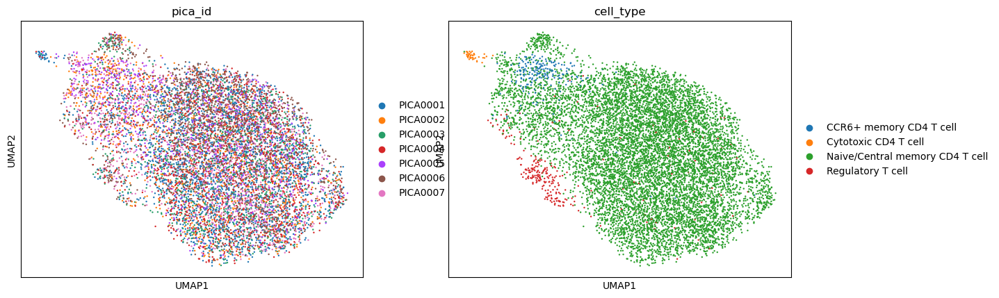

In [ ]:
#  latent representation 
raw_adata_cd4.obsm["X_scVI"] = model.get_latent_representation()

# compute neighbourhood and umap
sc.pp.neighbors(raw_adata_cd4, use_rep="X_scVI")
sc.tl.umap(raw_adata_cd4)


sc.pl.umap(raw_adata_cd4, color=[ "pica_id", 'cell_type'], save="_scvi_integrated_umap.png")

saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/umap_scvi_qc.png


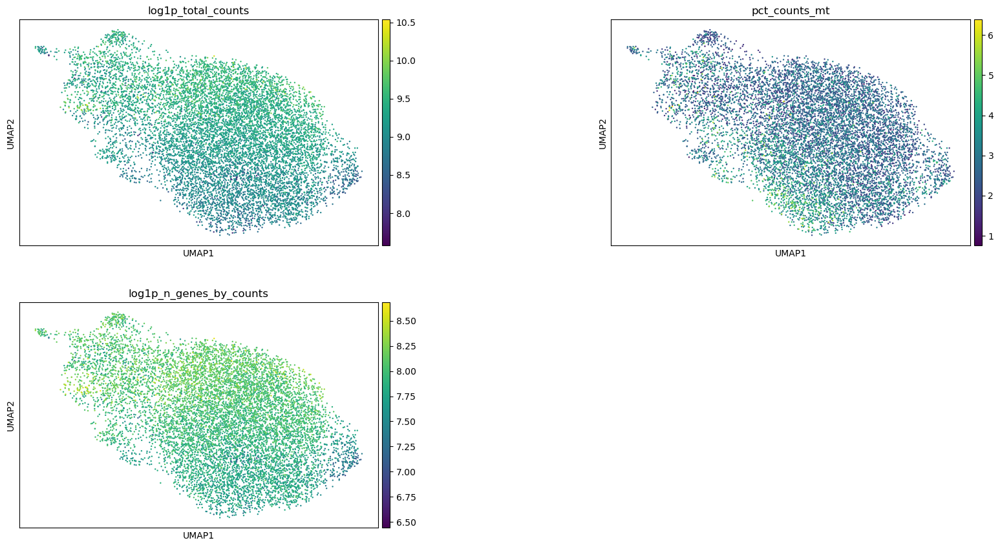

In [ ]:
# Overlay QC metrics on integrated UMAP to check whether clustering was driven by technical quality metrics rather than biological trnascriptional structure
sc.pl.umap(
    raw_adata_cd4,
    color=["log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
    save="_scvi_qc.png"
)

### Cells clustered according to biological identity rather than donor or batch origin following scVI integration, supporting successful integration of the paediatric CD4 dataset.

In [96]:
# Save the scVI integrated batch adata
raw_adata_cd4.write_h5ad("../../../write/02_batch_annotation//PICA0001-PICA0007/PICA0001-PICA0007_scVI.h5ad", compression='gzip')

## Clustering
Graph-based clustering was performed on the integrated latent space to identify transcriptionally distinct populations within the extracted CD4 subset.

Neighbour graphs were constructed using the scVI latent representation, followed by Leiden community detection for unsupervised clustering.

In [97]:
# Test different resolutions for Leiden clustering
# Higher resolution will result in more clusters, lower resolution will result in fewer clusters
for res in [ 0.5, 1.0, 1.5, 2.0]:
    sc.tl.leiden(
        raw_adata_cd4, key_added=f"leiden_res_{res:3.1f}", resolution=res, flavor="igraph"
    )

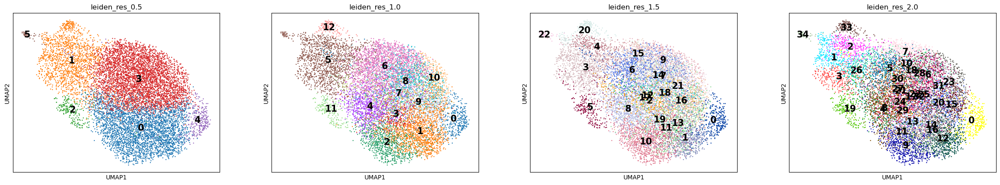

In [98]:
sc.pl.umap(
    raw_adata_cd4,
    color=[ "leiden_res_0.5", "leiden_res_1.0","leiden_res_1.5", "leiden_res_2.0"],
    legend_loc="on data", legend_fontsize = 15
)

In [99]:
# Save the clustered adata
raw_adata_cd4.write_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_scVI_cluster.h5ad", compression='gzip')
print(raw_adata_cd4)

AnnData object with n_obs × n_vars = 10059 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 
'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 
'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 
'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 
'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 
'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 
'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset', '_scvi_batch', 
'_scvi_labels', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 
'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 
'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 
'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 
'log1p_total_counts-2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 
'highly_variable_intersection'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'pica_id_colors', 'umap', '_scvi_uuid', '_scvi_manager_uuid', 
'cell_type_colors', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0', 
'leiden_res_0.5_colors', 'leiden_res_1.0_colors', 'leiden_res_1.5_colors', 'leiden_res_2.0_colors'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

### Distinct transcriptional clusters were observed following unsupervised clustering, indicating biological heterogeneity within the extracted CD4 T-cell subset.

___

## CD4 lineage validation
Canonical lineage markers were assessed across clusters to validate that the extracted subset predominantly represented CD4 T-cell populations and to identify potential contaminating non-CD4 populations.

***Previously defined markers were used***

In [100]:
raw_adata_cd4= sc.read_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_scVI_cluster.h5ad")
print(raw_adata_cd4)

AnnData object with n_obs × n_vars = 10059 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 
'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 
'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 
'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 
'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 
'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 
'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset', '_scvi_batch', 
'_scvi_labels', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 
'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 
'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 
'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 
'log1p_total_counts-2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 
'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_colors', 'hvg', 'leiden_res_0.5', 'leiden_res_0.5_colors', 
'leiden_res_1.0', 'leiden_res_1.0_colors', 'leiden_res_1.5', 'leiden_res_1.5_colors', 'leiden_res_2.0', 
'leiden_res_2.0_colors', 'log1p', 'neighbors', 'pca', 'pica_id_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [101]:
broad_marker_genes = {
    "B cell": ["BLNK", "CD19", "CD79A", "CD79B", "MS4A1", "CD37", "CD79A"],
    "Plasmablast": ["CD19", "CD24", "CD38"], # experiment
    "Dendritic cell": ["CLEC4C", "IL3RA", "NRP1", "CD1C", "CST3", "FCER1A", "CD123", "GZMB"],
    "Endothelial cell": ["CDH5", "SELE", "VWF"],
    "Fibroblast": ["COL1A1", "COL3A1", "FAP", "THY1"],
    'Neutrophils': ['S100A8', 'S100A9', 'CEACAM8', 'ELANE', 'CSF3R', 'MPO'],  # CEACAM8 is highly specific neutrophil marker
    'Eosinophils': ['IL5RA', 'CCR3', 'EPX', 'PRG2', 'GATA1', 'CLC'],  
    'Basophils': ['FCER1A', 'KIT', 'CPA3', 'HPGDS', 'ENPP3'],  
    "Classical monocyte": ["CD14", "FCGR3A", "LYZ", "FCGR1A", 'CCR2', 'S100A8', 'S100A9'], # CD14⁺ CD16/FCGR3A⁻
    "Intermediate monocyte": ["CD14", "FCGR3A", "HLA-DRA", "CCL2", 'ITGAX'], # CD14⁺ CD16⁺
    "Non-classical monocyte": ["CD14", "FCGR3A", "TREML4", "NR4A1", 'CX3CR1', 'HLA-DPB1'], # CD14⁻CD16⁺
    "Natural killer cell": ["CCL3", 'CD160', 'CD247', 'GNLY', 'GZMB', 'NKG7', 'FCGR3A', 'FCGR3B', 'KLRB1', 'KLRC1', 'KLRD1', 'KLRF1', 'KLRK1', 'NCAM1'],
    "Platelet": ["CD41", "ITGA2B", "CD34", "CD61", "PF4", 'PLA2G12A', 'PPBP'], # No megakaryocyte in blood
    'HSPC': ['CD34', 'CD38', 'THY1', 'KIT', 'PROM1', 'SLAMF1', 'ITGA6'],
    "T cell": ['CD3D', 'CD3E', 'CD3G', 'TRAC', 'TRBC1', 'TRDC'],
    "CD4+ memory T cell": ['CCR7', 'CD27', 'IL7R'],
    "CD4+ T cell": ['CD4', 'CTLA4', 'FOXP3', 'IL2RA'],
    "CD8+ T cell": ['CD4', 'CD8A', 'CD8B', 'GZMK'],
    "Naive T cell": ['CCR7', 'CD27', 'CD8A', 'CD8B'],
    "Natural killer T (NKT) cell": ['CD8A', 'CD8B', 'ZNF683'],
}

In [102]:
adata_full = raw_adata_cd4.raw.to_adata()
adata_full
present_marker_genes = {}

for celltype, markers in broad_marker_genes.items():
    present_markers = []
    for marker in markers:
        if marker in adata_full.var_names:
            present_markers.append(marker)
    present_marker_genes[celltype] = present_markers
print(present_marker_genes)

{
    'B cell': ['BLNK', 'CD19', 'CD79A', 'CD79B', 'MS4A1', 'CD37', 'CD79A'],
    'Plasmablast': ['CD19', 'CD24', 'CD38'],
    'Dendritic cell': ['CLEC4C', 'IL3RA', 'NRP1', 'CD1C', 'CST3', 'FCER1A', 'GZMB'],
    'Endothelial cell': ['CDH5', 'SELE', 'VWF'],
    'Fibroblast': ['COL1A1', 'COL3A1', 'FAP', 'THY1'],
    'Neutrophils': ['S100A8', 'S100A9', 'CEACAM8', 'ELANE', 'CSF3R', 'MPO'],
    'Eosinophils': ['IL5RA', 'CCR3', 'EPX', 'PRG2', 'GATA1', 'CLC'],
    'Basophils': ['FCER1A', 'KIT', 'CPA3', 'HPGDS', 'ENPP3'],
    'Classical monocyte': ['CD14', 'FCGR3A', 'LYZ', 'FCGR1A', 'CCR2', 'S100A8', 'S100A9'],
    'Intermediate monocyte': ['CD14', 'FCGR3A', 'HLA-DRA', 'CCL2', 'ITGAX'],
    'Non-classical monocyte': ['CD14', 'FCGR3A', 'TREML4', 'NR4A1', 'CX3CR1', 'HLA-DPB1'],
    'Natural killer cell': [
        'CCL3',
        'CD160',
        'CD247',
        'GNLY',
        'GZMB',
        'NKG7',
        'FCGR3A',
        'FCGR3B',
        'KLRB1',
        'KLRC1',
        'KLRD1',
        'KLRF1',
        'KLRK1',
        'NCAM1'
    ],
    'Platelet': ['ITGA2B', 'CD34', 'PF4', 'PLA2G12A', 'PPBP'],
    'HSPC': ['CD34', 'CD38', 'THY1', 'KIT', 'PROM1', 'SLAMF1', 'ITGA6'],
    'T cell': ['CD3D', 'CD3E', 'CD3G', 'TRAC', 'TRBC1', 'TRDC'],
    'CD4+ memory T cell': ['CCR7', 'CD27', 'IL7R'],
    'CD4+ T cell': ['CD4', 'CTLA4', 'FOXP3', 'IL2RA'],
    'CD8+ T cell': ['CD4', 'CD8A', 'CD8B', 'GZMK'],
    'Naive T cell': ['CCR7', 'CD27', 'CD8A', 'CD8B'],
    'Natural killer T (NKT) cell': ['CD8A', 'CD8B', 'ZNF683']
}

saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/dotplot__all_markers.png


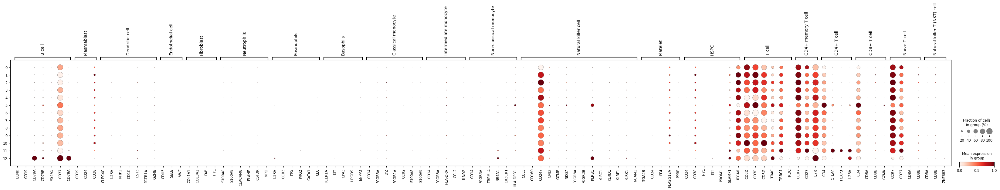

In [ ]:
# Broad dotplot
sc.pl.dotplot(raw_adata_cd4, present_marker_genes , groupby="leiden_res_1.0", standard_scale="var", save="_all_markers.png")

### Cluster 12 showed expression of canonical B-cell markers within the CD4 subset. Additional marker assessment was performed to determine whether this cluster represented residual B-cell contamination or a biologically meaningful CD4 T-cell population.

___

## Cluster 12 investigation

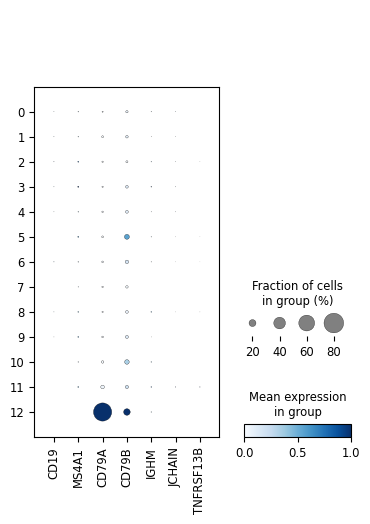

In [ ]:
# Check clusters against B cell markers
sc.pl.dotplot(raw_adata_cd4, ["CD19", "MS4A1", "CD79A", "CD79B", "IGHM", "JCHAIN", "TNFRSF13B"], groupby="leiden_res_1.0", standard_scale = "var", color_map = "Blues")

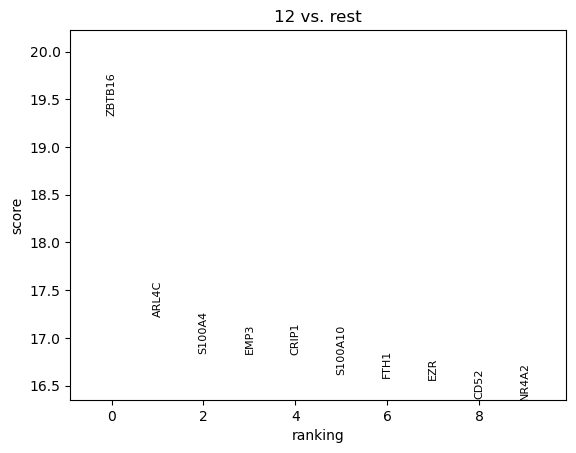

In [ ]:
# Check enriched genes in cluster 12
sc.tl.rank_genes_groups(raw_adata_cd4, groupby="leiden_res_1.0", groups=['12'], method="wilcoxon")
sc.pl.rank_genes_groups(raw_adata_cd4, groupby="leiden_res_1.0", n_genes=10)

In [ ]:
# top genes in cluster 12
print(sc.get.rank_genes_groups_df(raw_adata_cd4, group='12').head(30)["names"])

0       ZBTB16
1        ARL4C
2       S100A4
3         EMP3
4        CRIP1
5      S100A10
6         FTH1
7          EZR
8         CD52
9        NR4A2
10       ANXA1
11       AHNAK
12        IL32
13     LRRFIP1
14       CD79A
15         FOS
16       CLIC1
17    SH3BGRL3
18       PRKD3
19         CR1
20       FXYD5
21        TPM3
22        CCR4
23      PIK3R1
24     TAMALIN
25       DUSP1
26      CSRNP1
27        SRGN
28       AUTS2
29      ADAM19
Name: names, dtype: object

saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/umap_cluster12_marker_overlays.png


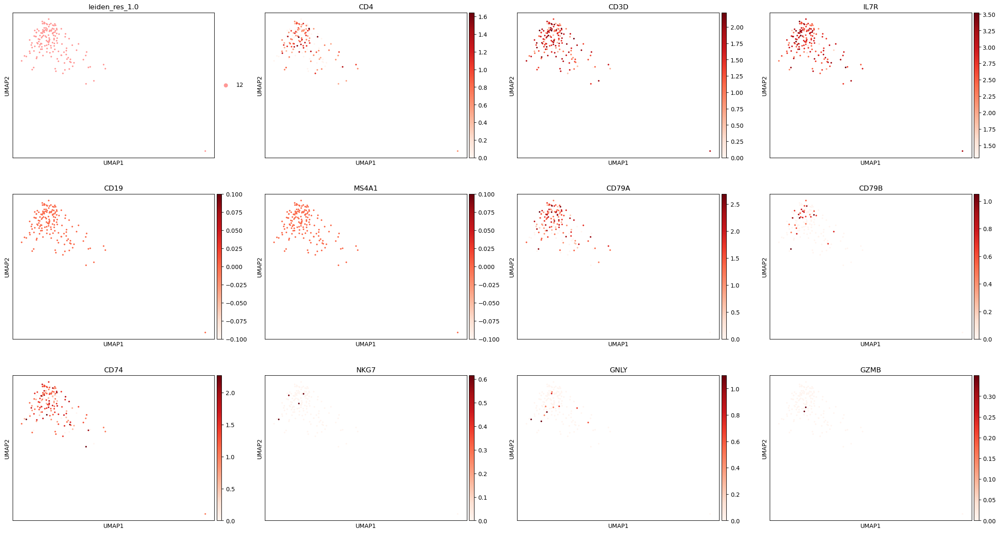

In [ ]:
# check core marker expression overlays for cluster 12
# co-expression of T-cell and B-cell --> likely T/B doublets
cluster_12_cells = raw_adata_cd4[raw_adata_cd4.obs['leiden_res_1.0'] == '12']
sc.pl.umap(
    cluster_12_cells,
    color=["leiden_res_1.0","CD4","CD3D","IL7R",     # CD4 T markers
           'CD19',"MS4A1","CD79A","CD79B","CD74", # B cell markers
           "NKG7","GNLY","GZMB"],   # NK / cytotoxic markers
    vmax="p99",
    cmap="Reds",
    size=30,
    save="_cluster12_marker_overlays.png"
)

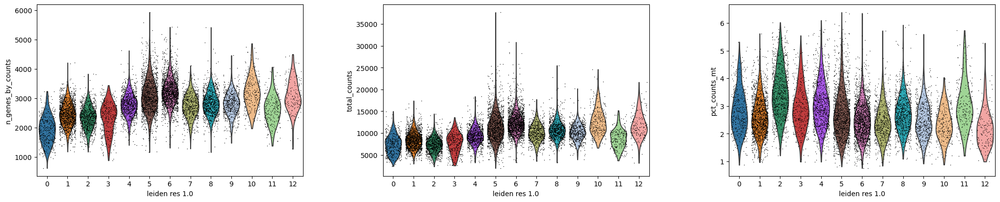

In [ ]:
# QC of cluster 12 to check for technical artefacts
sc.pl.violin(raw_adata_cd4, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], groupby= 'leiden_res_1.0', jitter=0.4, multi_panel=True)

## Cluster 12 recluster
Subcluster cluster 12 to determine whether it contains distinct subpopulations or a homogeneous contaminating/doublet population.

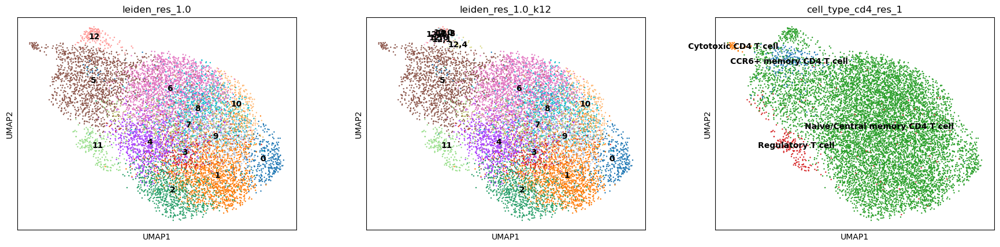

In [109]:
raw_adata_cd4.obs['cell_type_cd4_res_1'] = raw_adata_cd4.obs['cell_type'].copy()
adata_cd4_k12 = raw_adata_cd4.copy()
sc.tl.leiden(adata_cd4_k12, resolution=1.0, restrict_to=('leiden_res_1.0', ['12']), key_added='leiden_res_1.0_k12')
sc.pl.umap(adata_cd4_k12, color=['leiden_res_1.0', 'leiden_res_1.0_k12','cell_type_cd4_res_1'], legend_loc="on data")


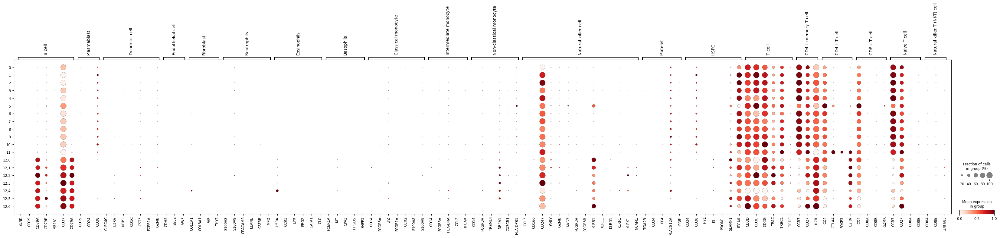

In [110]:
sc.pl.dotplot(adata_cd4_k12, present_marker_genes , groupby="leiden_res_1.0_k12", standard_scale="var")

### Cluster 12 showed expression of canonical B-cell markers, including CD79A and CD79B, together with T-cell-associated markers. This mixed lineage signature is consistent with likely T/B doublets or contaminating B-cell-like cells rather than a true CD4 T-cell population. Therefore, cluster 12 was excluded prior to downstream CD4 analyses.

In [ ]:
# remove cluster 12
raw_adata_cd4.obs['leiden_res_1.0'] = raw_adata_cd4.obs['leiden_res_1.0'].astype(str)
raw_adata_cd4 = raw_adata_cd4[raw_adata_cd4.obs['leiden_res_1.0'] != '12', :].copy()

In [112]:
raw_adata_cd4.obs['cell_type_cd4_res_1'].value_counts()

cell_type_cd4_res_1
Naive/Central memory CD4 T cell    9373
Regulatory T cell                   267
CCR6+ memory CD4 T cell             221
Cytotoxic CD4 T cell                 43
Name: count, dtype: int64

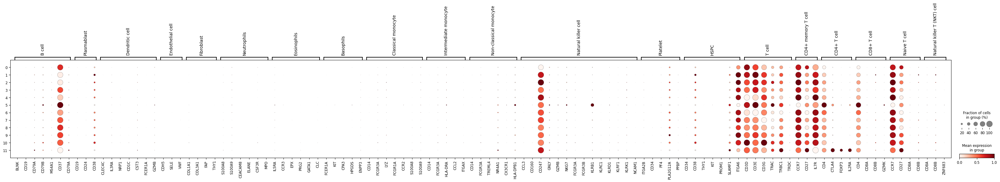

In [113]:
sc.pl.dotplot(raw_adata_cd4,present_marker_genes , groupby="leiden_res_1.0", standard_scale="var")

In [114]:
# save data without cluster 12
raw_adata_cd4.write_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_preprocessed_2.h5ad", compression='gzip')


In [115]:
adata_cd4= sc.read_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_preprocessed_2.h5ad")
adata_cd4.var_names_make_unique()
print(adata_cd4)

AnnData object with n_obs × n_vars = 9904 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 
'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 
'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 
'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 
'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 
'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 
'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset', '_scvi_batch', 
'_scvi_labels', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0', 'cell_type_cd4_res_1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 
'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 
'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 
'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 
'log1p_total_counts-2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 
'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_colors', 'hvg', 'leiden_res_0.5', 'leiden_res_0.5_colors', 
'leiden_res_1.0', 'leiden_res_1.0_colors', 'leiden_res_1.5', 'leiden_res_1.5_colors', 'leiden_res_2.0', 
'leiden_res_2.0_colors', 'log1p', 'neighbors', 'pca', 'pica_id_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

___

## Rerun scVi after cluster 12 removal
Re-run scVI after removing the contaminating cluster to regenerate the integrated latent space using only the cleaned CD4 dataset.

In [ ]:
scvi.model.SCVI.setup_anndata(adata_cd4, layer="counts", batch_key="pica_id")
model_clean = scvi.model.SCVI(adata_cd4, n_layers=2, n_latent=30, gene_likelihood="nb")

In [117]:
model_clean.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|██████████| 400/400 [2:32:11<00:00, 19.41s/it, v_num=1, train_loss_step=7.9e+3, train_loss_epoch=7.8e+3]    

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [2:32:11<00:00, 22.83s/it, v_num=1, train_loss_step=7.9e+3, train_loss_epoch=7.8e+3]


saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/umap_scvi_integrated_umap.png


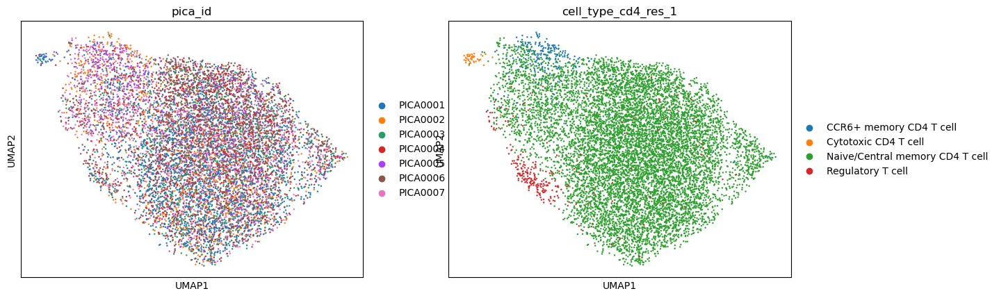

In [ ]:
#  latent representation 
adata_cd4.obsm["X_scVI"] = model_clean.get_latent_representation()

sc.pp.neighbors(adata_cd4, use_rep="X_scVI")
sc.tl.umap(adata_cd4)


sc.pl.umap(adata_cd4, color=[ "pica_id", 'cell_type_cd4_res_1'], save="_scvi_integrated_umap.png")

saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/umap_scvi_qc.png


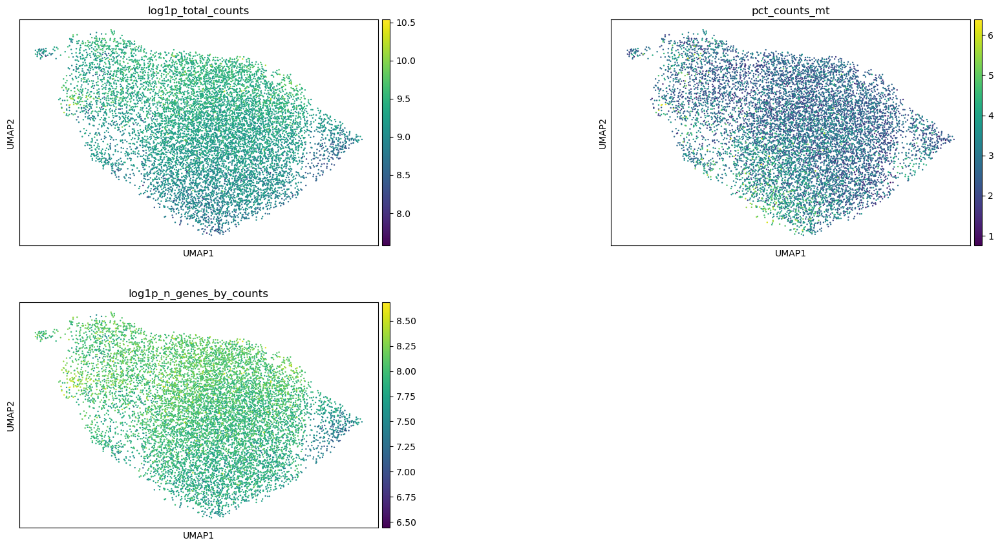

In [119]:
sc.pl.umap(
    adata_cd4,
    color=["log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
    save="_scvi_qc.png"
)

In [120]:
# Save the scVI integrated batch adata
adata_cd4.write_h5ad("../../../write/02_batch_annotation//PICA0001-PICA0007/PICA0001-PICA0007_scVI_2.h5ad", compression='gzip')

In [121]:
adata_cd4= sc.read_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_scVI_2.h5ad")

In [122]:
# clustering
for res in [ 0.5, 1.0, 1.5, 2.0]:
    sc.tl.leiden(
        adata_cd4, key_added=f"leiden_res_{res:3.1f}", resolution=res, flavor="igraph"
    )

In [123]:
keys = ["leiden_res_0.5", "leiden_res_1.0", "leiden_res_1.5", "leiden_res_2.0"]


for k in keys:
    if k in adata_cd4.obs:
        # ensure categorical and drop removed labels
        adata_cd4.obs[k] = adata_cd4.obs[k].astype("category").cat.remove_unused_categories()
        # drop stale palette so Scanpy creates a new one with correct length
        ckey = f"{k}_colors"
        if ckey in adata_cd4.uns:
            del adata_cd4.uns[ckey]

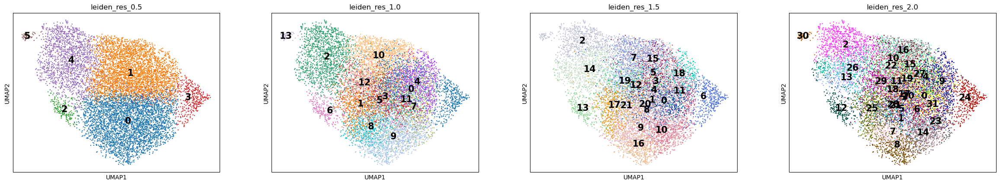

In [124]:
sc.pl.umap(
    adata_cd4,
    color=[ "leiden_res_0.5", "leiden_res_1.0","leiden_res_1.5", "leiden_res_2.0"],
    legend_loc="on data", legend_fontsize = 15
)

In [125]:
adata_cd4.write_h5ad("../../../write/02_batch_annotation/PICA0001-PICA0007/PICA0001-PICA0007_scVI_cluster_2.h5ad", compression='gzip')
print(adata_cd4)

AnnData object with n_obs × n_vars = 9904 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 
'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 
'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 
'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 
'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 
'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 
'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset', '_scvi_batch', 
'_scvi_labels', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0', 'cell_type_cd4_res_1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 
'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 
'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 
'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 
'log1p_total_counts-2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 
'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_cd4_res_1_colors', 'cell_type_colors', 'hvg', 
'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0', 'log1p', 'neighbors', 'pca', 
'pica_id_colors', 'rank_genes_groups', 'umap', 'leiden_res_0.5_colors', 'leiden_res_1.0_colors', 
'leiden_res_1.5_colors', 'leiden_res_2.0_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

saving figure to file ../../../figures/PICA0001-PICA0007/02_annotation/dotplot__all_markers.png


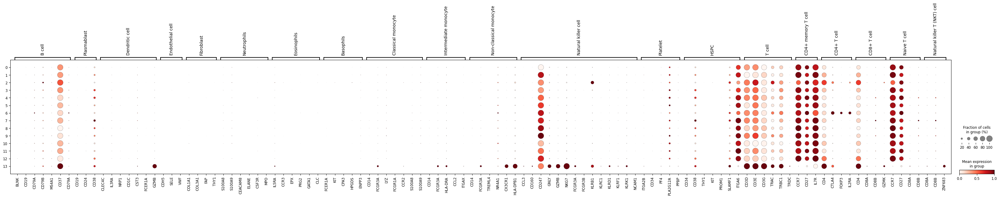

In [ ]:
sc.pl.dotplot(adata_cd4, present_marker_genes , groupby="leiden_res_1.0", standard_scale="var", save="_all_markers.png")

### Cluster 13 needs further investigation -> showed cytotoxic/NK-associated marker expression. 


___

## Cluster 13 investigation
Additional validation was performed to determine whether this represented contaminating NK cells or a biologically relevant cytotoxic CD4 T-cell population.

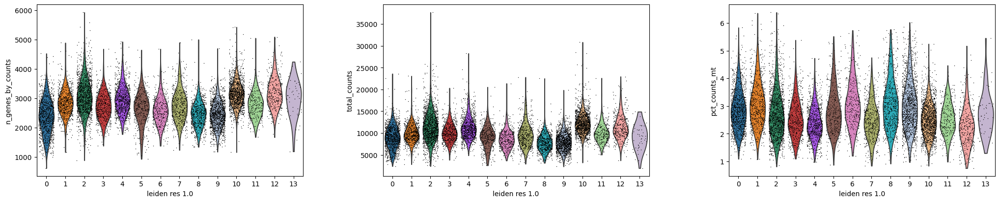

In [ ]:
# check QC of cluster 13
sc.pl.violin(adata_cd4, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], groupby= 'leiden_res_1.0', jitter=0.4, multi_panel=True)

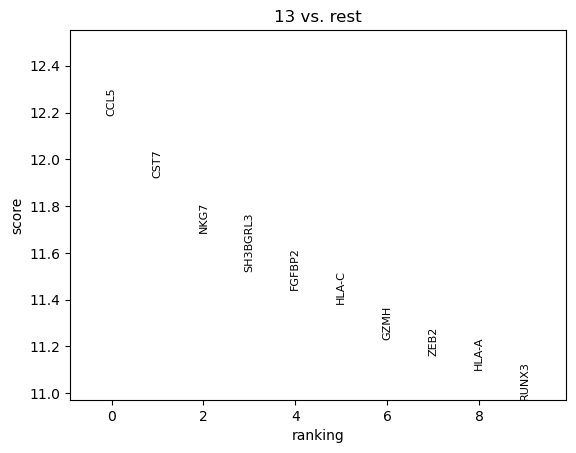

In [ ]:
# Genes enriched in cluster 13
sc.tl.rank_genes_groups(adata_cd4, groupby="leiden_res_1.0", groups=['13'], method="wilcoxon")
sc.pl.rank_genes_groups(adata_cd4, groupby="leiden_res_1.0", n_genes=10)

## Recluster of cluster 13

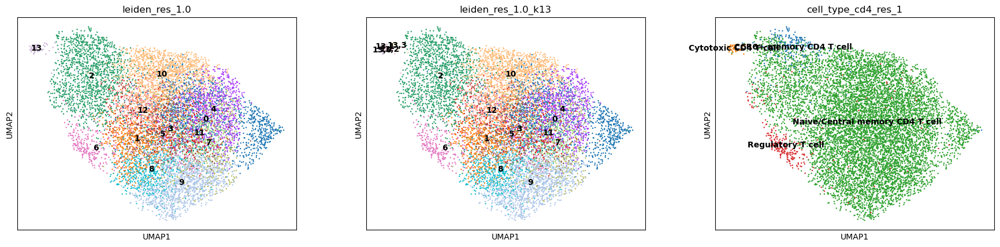

In [127]:
adata_cd4_k13 = adata_cd4.copy()
sc.tl.leiden(adata_cd4_k13, resolution=1.0, restrict_to=('leiden_res_1.0', ['13']), key_added='leiden_res_1.0_k13')
sc.pl.umap(adata_cd4_k13, color=['leiden_res_1.0', 'leiden_res_1.0_k13','cell_type_cd4_res_1'], legend_loc="on data")

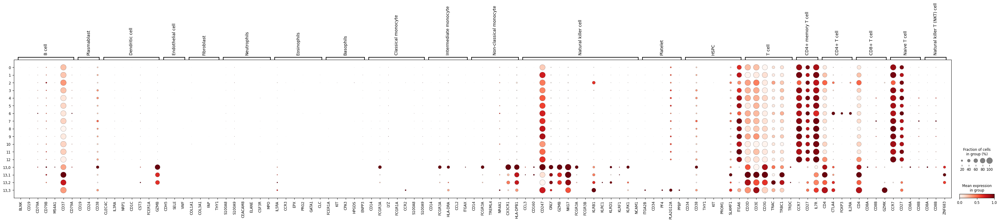

In [128]:
sc.pl.dotplot(adata_cd4_k13, present_marker_genes , groupby="leiden_res_1.0_k13", standard_scale="var")

### Cluster 13 lacked expression of canonical B-cell markers and instead exhibited cytotoxic-associated gene expression. These findings supported annotation as a cytotoxic CD4 T-cell population rather than contaminating B cells and the cluster was retained for downstream analyses.

In [130]:
adata_cd4.obs['cell_type_cd4_res_1'].value_counts()

cell_type_cd4_res_1
Naive/Central memory CD4 T cell    9373
Regulatory T cell                   267
CCR6+ memory CD4 T cell             221
Cytotoxic CD4 T cell                 43
Name: count, dtype: int64

In [ ]:
# save final validated CD4 AnnData
adata_cd4.write_h5ad("../../../write/02_batch_annotation//PICA0001-PICA0007/PICA0001-PICA0007_cd4_annotations.h5ad", compression='gzip')
print(adata_cd4)

AnnData object with n_obs × n_vars = 9904 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 
'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 
'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 
'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 
'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 
'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 
'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset', '_scvi_batch', 
'_scvi_labels', 'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0', 'cell_type_cd4_res_1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 
'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 
'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 
'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 
'log1p_total_counts-2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 
'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_cd4_res_1_colors', 'cell_type_colors', 'hvg', 
'leiden_res_0.5', 'leiden_res_1.0', 'leiden_res_1.5', 'leiden_res_2.0', 'log1p', 'neighbors', 'pca', 
'pica_id_colors', 'rank_genes_groups', 'umap', 'leiden_res_0.5_colors', 'leiden_res_1.0_colors', 
'leiden_res_1.5_colors', 'leiden_res_2.0_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'